<a href="https://colab.research.google.com/github/RoadoneP/Machine_learning/blob/main/CVPR2016/Style_Transfer_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [17]:
# 필요한 PyTorch 라이브러리 불러오기
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models

from PIL import Image
import matplotlib.pyplot as plt

import copy

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
device

device(type='cuda')

In [18]:
# 이미지를 불러와 다운받아 텐서(Tensor) 객체로 변환하는 함수
# Tensor는 Numpy 배열과 비슷한 다차원 배열, 수학적 연산을 가속화, 연산 추적(requires_grad) 가능 GPU에 적합
def image_loader(img_path, imsize):
  loader = transforms.Compose([
                               transforms.Resize(imsize), # 이미지의 크기를 변경
                               transforms.ToTensor()  # torch.Tensor 형식으로 변경 [0, 255] → [0, 1]
  ]) #데이터 전처리
  image = Image.open(img_path)
  # 네트워크 입력에 들어갈 이미지에 배치 목적의 차원(dimension) 추가
  image = loader(image).unsqueeze(0) #배치 목적을 위함 torch.Size([3]) -> torch.Size([1, 3])
  return image.to(device, torch.float) # GPU로 올리기

# torch.Tensor 형태의 이미지를 화면에 출력하는 함수
def imshow(tensor):
  # matplotlib는 CPU 기반이므로 CPU로 옮기기
  image = tensor.cpu().clone()
  # torch.Tensor에서 사용되는 배치 목적의 차원(dimension) 제거
  image = image.squeeze(0)
  # PIL 객체로 변경 
  image = transforms.ToPILImage()(image)
  # 이미지를 화면에 출력(matplotlib는 [0, 1] 사이의 값이라고 해도 정상적으로 처리)
  plt.imshow(image)
  plt.show()

In [8]:
%cd /content/drive/MyDrive/Style_Transfer_Tutorial

/content/drive/MyDrive/Style_Transfer_Tutorial


In [9]:
!git clone https://github.com/ndb796/Deep-Learning-Paper-Review-and-Practice

Cloning into 'Deep-Learning-Paper-Review-and-Practice'...
remote: Enumerating objects: 432, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (171/171), done.
remote: Total 432 (delta 60), reused 0 (delta 0), pack-reused 261
Receiving objects: 100% (432/432), 46.63 MiB | 20.57 MiB/s, done.
Resolving deltas: 100% (140/140), done.
Checking out files: 100% (55/55), done.


## image Reconstruction
- 이미지를 최적화(optimization)한다는 것은 특정 손실 값을 낮추는 방향으로 이미지를 업데이트하는 것을 의미한다.
- MSE 손실(loss)을 이용해 임의의 노이즈(noise)를 특정한 이미지로 변환.

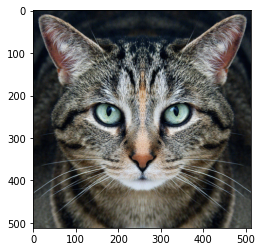

In [19]:
# 목표 이미지(target image) 불러오기
img_path = '/content/drive/MyDrive/Style_Transfer_Tutorial/Deep-Learning-Paper-Review-and-Practice/code_practices/images/cat.jpg'
target_image = image_loader(img_path, (512, 512))
imshow(target_image)

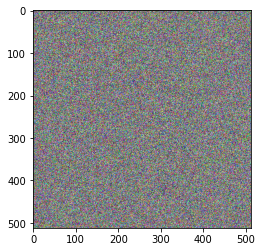

In [23]:
# 동일한 크기의 노이즈 이미지 준비하기
noise = torch.empty_like(target_image).uniform_(0, 1).to(device)
imshow(noise)

[ Start ]


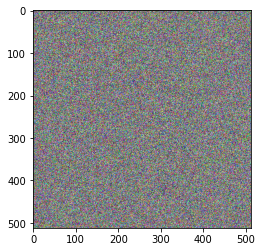

[ Step: 10 ]
Loss: 0.10405842959880829


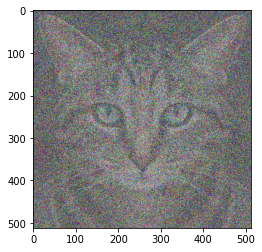

[ Step: 20 ]
Loss: 0.062162190675735474


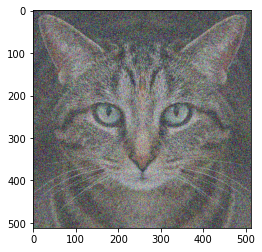

[ Step: 30 ]
Loss: 0.037134312093257904


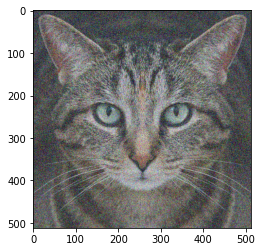

[ Step: 40 ]
Loss: 0.022183209657669067


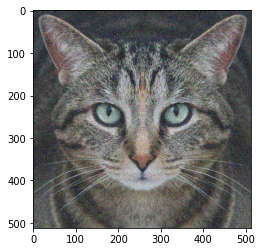

[ Step: 50 ]
Loss: 0.013251757249236107


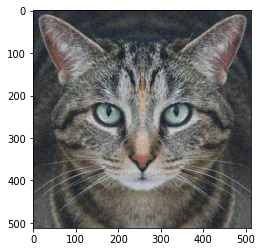

[ Step: 60 ]
Loss: 0.007916303351521492


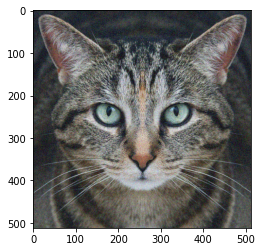

[ Step: 70 ]
Loss: 0.004729024134576321


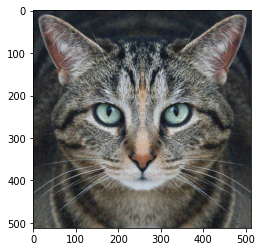

[ Step: 80 ]
Loss: 0.00282501382753253


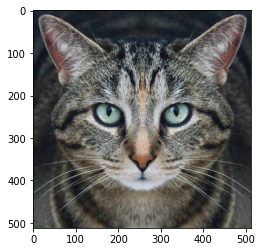

[ Step: 90 ]
Loss: 0.001687600277364254


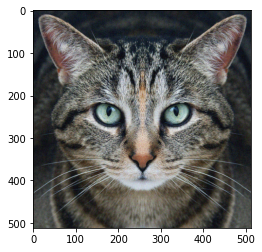

[ Step: 100 ]
Loss: 0.001008134800940752


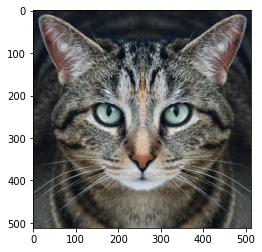

In [24]:
loss = nn.MSELoss() # loss함수 설정
iters = 100 # 반복(iteration) 설정
lr = 1e4

print("[ Start ]")
imshow(noise)

for i in range(iters):
    # required_grad 속성의 값을 True로 설정하여 해당 torch.Tensor의 연산을 추적
    noise.requires_grad = True

    # 손실 함수에 대하여 미분하여 기울기(gradient) 계산
    output = loss(noise, target_image)
    output.backward()

    # 계산된 기울기(gradient)를 이용하여 손실 함수가 감소하는 방향으로 업데이트
    gradient = lr * noise.grad
    # 결과적으로 노이즈(perturbation)의 각 픽셀의 값이 [-eps, eps] 사이의 값이 되도록 자르기
    noise = torch.clamp(noise - gradient, min=0, max=1).detach_() # 연산을 추적하는 것을 중단하기 위해 detach() 호출

    if (i + 1) % 10 == 0:
        print(f'[ Step: {i + 1} ]')
        print(f'Loss: {output}')
        imshow(noise)


## 실습을 위한 이미지 불러오기
- 빈센트 반 고흐의 그림과 건물 사진을 부른다.

[ Content Image ]


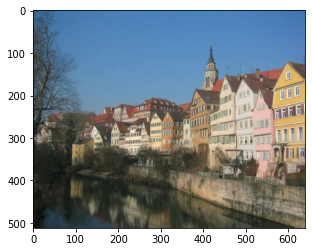

[ Style Image ]


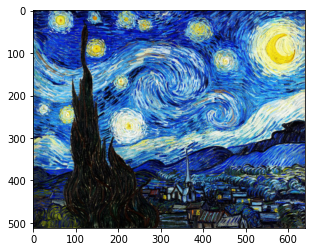

In [26]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./Deep-Learning-Paper-Review-and-Practice/code_practices/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./Deep-Learning-Paper-Review-and-Practice/code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

## CNN 네트워크 불러오기
- 특징 추출기(feature extractor)로 VGG 네트워크를 사용

In [27]:
# 뉴럴 네트워크 모델을 불러옵니다.
cnn = models.vgg19(pretrained=True).features.to(device).eval()
print(cnn)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth



Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPo

In [28]:
# 입력 정규화(Normalization)를 위한 초기화
# 일반적으로 ImageNet의 mean과 std값을 사용
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
  def __init__(self, mean, std):
    super(Normalization, self).__init__()
    self.mean = mean.clone().view(-1, 1, 1) #mean이라는 tensor를 (?, 1, 1)크기로 변경
    self.std = std.clone().view(-1, 1, 1)

  def forward(self, img):
    return (img - self.mean) / self.std

## Style Reconstruction 실습하기
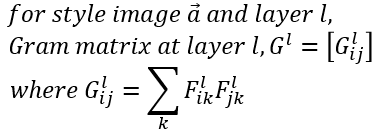
- 임의의 노이즈(noise)가 특정한 이미지의 스타일을 가지도록 변환한다.
- style_layers 리스트 변수의 값을 조절하여 어떤 레이어를 이용할지 설정.

In [29]:
def gram_matrix(input):
    # b는 배치 크기, c는 특징 맵의 개수, (w, h)는 특징 맵의 차원을 의미
    b, c, w, h = input.size()
    # 논문에서는 i = 특징 맵의 개수, j = 각 위치(position)
    features = input.view(b * c, w * h)
    # 행렬 곱으로 한 번에 Gram 내적 계산 가능
    G = torch.mm(features, features.t())
    # Normalize 목적으로 값 나누기
    return G.div(b * c * w * h)

# 스타일 손실(style loss) 계산을 위한 클래스 정의
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [38]:
style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

# 스타일 손실(style loss)을 계산하는 함수
def get_style_losses(cnn, style_img, noise_image):
  cnn = copy.deepcopy(cnn)
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
  style_losses = []

  # 가장 먼저 입력 이미지가 입력 정규화(input normalization)을 수행하도록
  model = nn.Sequential(normalization)

  # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인
  i = 0
  for layer in cnn.children():
    if isinstance(layer, nn.Conv2d): #만약 layer가 Conv2d이면
      i += 1
      name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
      name = 'relu_{}'.format(i)
      layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
      name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
      name = 'bn_{}'.format(i)
    else:
      raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

    model.add_module(name, layer)

    # 설정한 style layer까지의 결과를 이용해 style loss를 계산
    if name in style_layers:
      target_feature = model(style_img).detach()
      style_loss = StyleLoss(target_feature)
      model.add_module("style_loss_{}".format(i), style_loss)
      style_losses.append(style_loss)
      
  # 마지막 style loss 이후의 레이어는 사용하지 않도록
  for i in range(len(model) -1, -1, -1):
    if isinstance(model[i], StyleLoss):
      break

  model = model[:(i + 1)]
  return model, style_losses

In [33]:
def style_reconstruction(cnn, style_img, input_img, iters):
    model, style_losses = get_style_losses(cnn, style_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])
  # optimizer = optim.Adam([input_img,requires_grad_()])
    print(model)
    print(style_losses)
    print("[ Start ]")
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1) #input이미지가 범위를 벗어나지 못하게 자른다.

            optimizer.zero_grad() #optimizer 초기화
            model(input_img) #모델에 input_image 넣기
            style_score = 0 #초기화

            for sl in style_losses:
                style_score += sl.loss
 
            style_score *= 1e6 #너무 작은 값인 경우
            style_score.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print(f"[ Step: {run[0]} / Style loss: {style_score.item()}]")
                imshow(input_img)
            
            return style_score
        
        optimizer.step(closure) #loss값을 를 optimizer

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
    input_img.data.clamp_(0, 1)

    return input_img

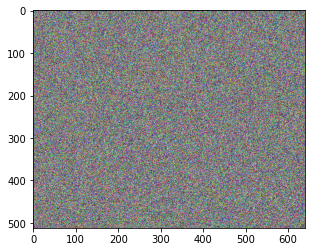

In [34]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_1): StyleLoss()
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_2): StyleLoss()
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_3): StyleLoss()
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_4): StyleLoss()
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_5): StyleLoss()
)
[StyleLoss(), StyleLoss(), StyleLoss(), StyleLoss(), StyleLoss()]
[ Start ]


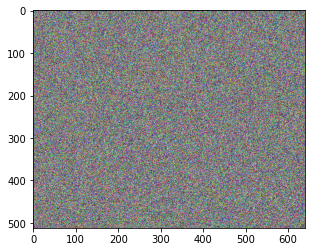

[ Step: 50 / Style loss: 424.3435363769531]


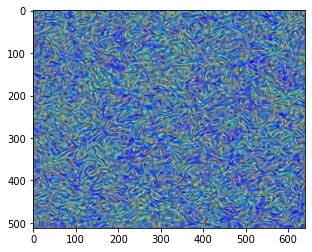

[ Step: 100 / Style loss: 102.17755126953125]


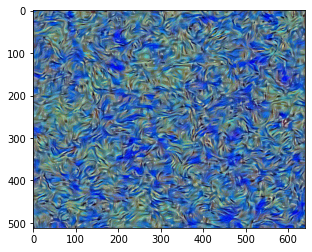

[ Step: 150 / Style loss: 48.765892028808594]


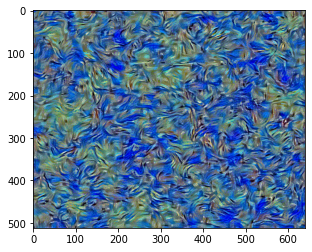

[ Step: 200 / Style loss: 35.28145217895508]


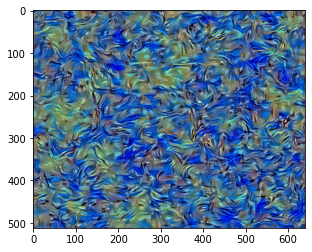

[ Step: 250 / Style loss: 28.2125244140625]


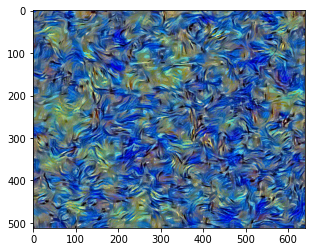

[ Step: 300 / Style loss: 23.238357543945312]


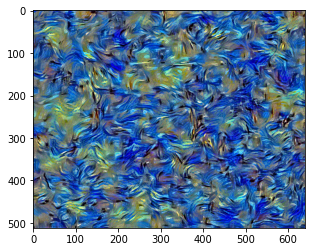

In [39]:
# style reconstruction 수행
output = style_reconstruction(cnn, style_img=style_img, input_img=input_img, iters=300)

## Content Reconstruction 실습하기
- 임의의 노이즈(noise)가 특정한 이미지의 콘텐츠를 가지도록 변환합니다.

In [40]:
# 콘텐츠 손실(content loss) 계산을 위한 클래스 정의
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [41]:
content_layers = ['conv_4']

# 콘텐츠 손실(content loss)를 계산하는 함수
def get_content_losses(cnn, content_img, noise_image):
  cnn = copy.deepcopy(cnn)
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
  content_losses = []

  # 가장 먼저 입력 이미지가 입력 정규화(input normalization)을 수행하도록
  model = nn.Sequential(normalization)

  # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인하며
  i = 0
  for layer in cnn.children():
    if isinstance(layer, nn.Conv2d):
      i += 1
      name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
      name = 'relu_{}'.format(i)
      layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
      name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
      name = 'bn_{}'.format(i)
    else:
      raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

    model.add_module(name, layer)

    # 설정한 content layer까지의 결과를 이용해 content loss를 계산
    if name in content_layers:
      target_feature = model(content_img).detach()
      content_loss = ContentLoss(target_feature)
      model.add_module("content_loss_{}".format(i), content_loss)
      content_losses.append(content_loss)

    # 마지막 content loss 이후의 레이어는 사용하지 않도록
  for i in range(len(model) - 1, -1, -1):
    if isinstance(model[i], ContentLoss):
      break

  model = model[:(i + 1)]
  return model, content_losses

In [55]:
def content_reconstruction(cnn, content_img, input_img, iters):
  model, content_losses = get_content_losses(cnn, content_img, input_img)
  optimizer = optim.LBFGS([input_img.requires_grad_()])

  print(model)
  print(content_losses)
  print("[ Start ]")
  imshow(input_img)

  # 하나의 값만 이용하기 위해 배열 형태로 사용
  run = [0]
  while run[0] <= iters:

    def closure():
      input_img.data.clamp_(0, 1)

      optimizer.zero_grad()
      model(input_img)
      content_score = 0

      for cl in content_losses:
        content_score += cl.loss

      content_score.backward()

      run[0] += 1
      if run[0] % 50 == 0:
        print(f"[ Step: {run[0]} / Content loss: {content_score.item()}]")
        imshow(input_img)
            
      return content_score
        
    optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
  input_img.data.clamp_(0, 1)

  return input_img

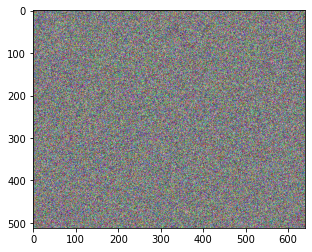

In [56]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비하기
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (content_loss_4): ContentLoss()
)
[ContentLoss()]
[ Start ]


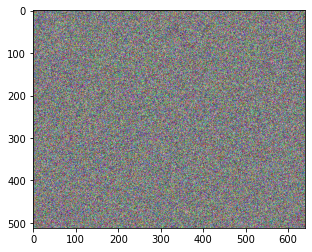

[ Step: 50 / Content loss: 0.7438917756080627]


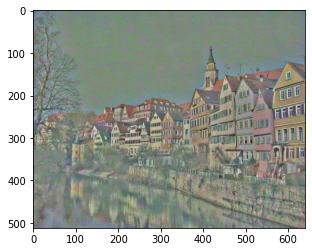

[ Step: 100 / Content loss: 0.37191042304039]


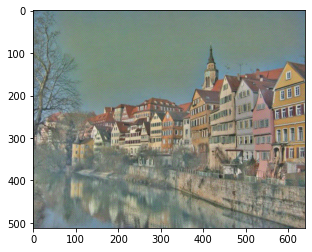

[ Step: 150 / Content loss: 0.24021463096141815]


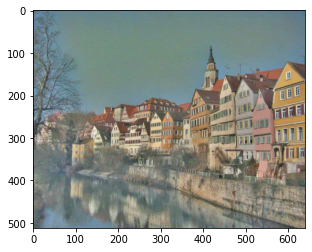

[ Step: 200 / Content loss: 0.17236940562725067]


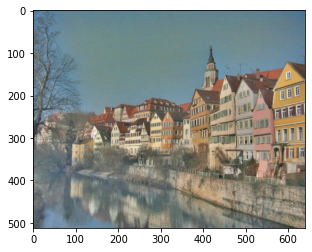

[ Step: 250 / Content loss: 0.13148826360702515]


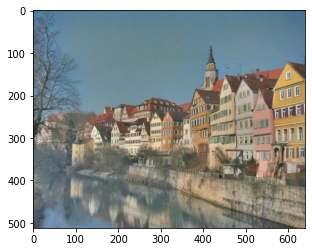

[ Step: 300 / Content loss: 0.10251399129629135]


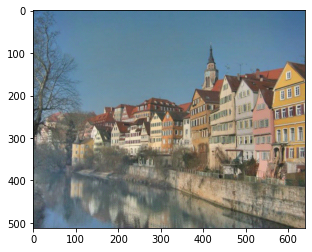

In [57]:
# content reconstruction 수행
output = content_reconstruction(cnn, content_img=content_img, input_img=input_img, iters=300)

## Style Transfer
Content Loss와 Style Loss를 함께 이용하여 Style Transfer를 진행합니다.

In [50]:
content_layers = ['conv_4']
style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_7', 'conv_9']

def get_losses(cnn, content_img, style_img, noise_image):
  cnn = copy.deepcopy(cnn)
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
  content_losses = []
  style_losses = []
    
  # 가장 먼저 입력 이미지가 입력 정규화(input normalization)를 수행하도록
  model = nn.Sequential(normalization)

  # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인하며
  i = 0
  for layer in cnn.children():
    if isinstance(layer, nn.Conv2d):
      i += 1
      name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
      name = 'relu_{}'.format(i)
      layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
      name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
      name = 'bn_{}'.format(i)
    else:
      raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

    model.add_module(name, layer)

    # 설정한 content layer까지의 결과를 이용해 content loss를 계산
    if name in content_layers:
      target_feature = model(content_img).detach()
      content_loss = ContentLoss(target_feature)
      model.add_module("content_loss_{}".format(i), content_loss)
      content_losses.append(content_loss)

    # 설정한 style layer까지의 결과를 이용해 style loss를 계산
    if name in style_layers:
      target_feature = model(style_img).detach()
      style_loss = StyleLoss(target_feature)
      model.add_module("style_loss_{}".format(i), style_loss)
      style_losses.append(style_loss)

  # 마지막 loss 이후의 레이어는 사용하지 않도록
  for i in range(len(model) - 1, -1, -1):
    if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
        break

    model = model[:(i + 1)]
    return model, content_losses, style_losses

In [59]:
def style_transfer(cnn, content_img, style_img, input_img, iters):
  model, content_losses, style_losses = get_losses(cnn, content_img, style_img, input_img)
  optimizer = optim.LBFGS([input_img.requires_grad_()])
  
  print(model)
  print(content_losses)
  print(style_losses)
  
  print("[ Start ]")
  imshow(input_img)

  # 하나의 값만 이용하기 위해 배열 형태로 사용
  run = [0]
  while run[0] <= iters:

    def closure():
      input_img.data.clamp_(0, 1)

      optimizer.zero_grad()
      model(input_img)
      content_score = 0
      style_score = 0

      for cl in content_losses:
        content_score += cl.loss
      for sl in style_losses:
        style_score += sl.loss

      style_score *= 1e5
      #meta loss에 content_score이랑 style_score를 더한다.
      loss = content_score + style_score
      loss.backward()

      run[0] += 1
      if run[0] % 100 == 0:
        print(f"[ Step: {run[0]} / Content loss: {content_score.item()} / Style loss: {style_score.item()}]")
        imshow(input_img)
            
      return content_score + style_score
        
    optimizer.step(closure)

  # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
  input_img.data.clamp_(0, 1)

  return input_img

[ Content Image ]


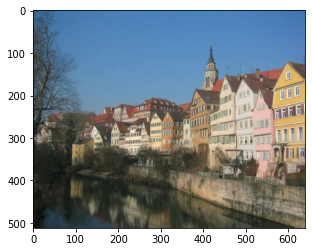

[ Style Image ]


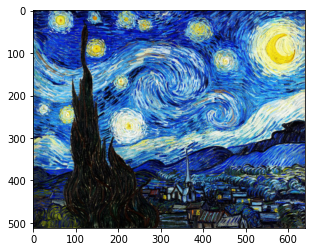

In [60]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./Deep-Learning-Paper-Review-and-Practice/code_practices/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./Deep-Learning-Paper-Review-and-Practice/code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

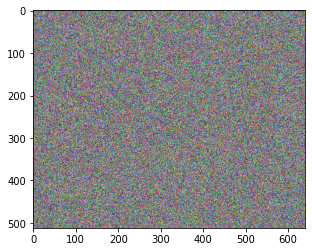

In [61]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비하기
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_1): StyleLoss()
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_3): StyleLoss()
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (content_loss_4): ContentLoss()
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_5): StyleLoss()
  (relu_5): ReLU()
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_6): ReLU()
  (conv_7): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

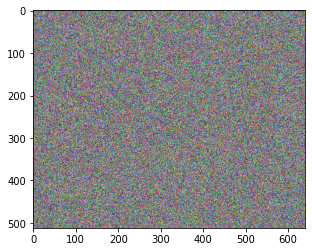

[ Step: 100 / Content loss: 44.65852737426758 / Style loss: 27.27617645263672]


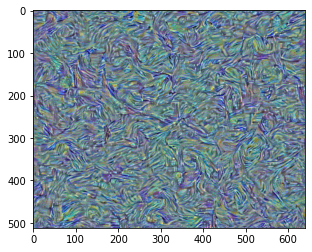

[ Step: 200 / Content loss: 36.91670227050781 / Style loss: 9.244935989379883]


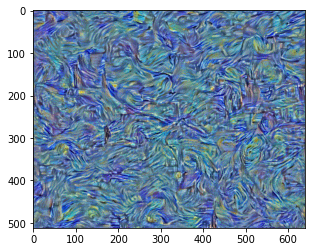

[ Step: 300 / Content loss: 31.20130729675293 / Style loss: 5.973529815673828]


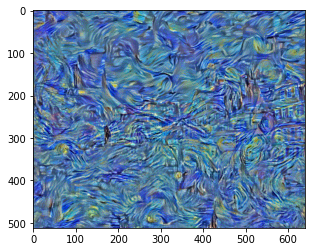

[ Step: 400 / Content loss: 27.618436813354492 / Style loss: 4.828117370605469]


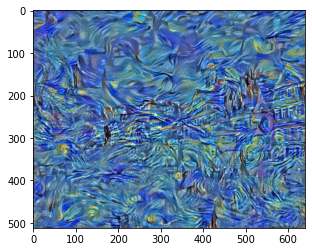

[ Step: 500 / Content loss: 25.428096771240234 / Style loss: 4.096868515014648]


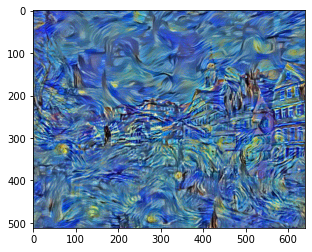

[ Step: 600 / Content loss: 23.895177841186523 / Style loss: 3.626877784729004]


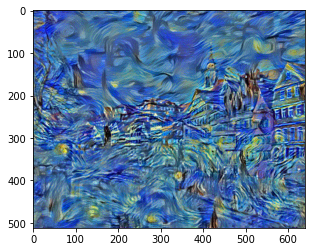

[ Step: 700 / Content loss: 22.738874435424805 / Style loss: 3.344099998474121]


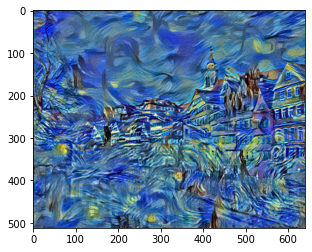

[ Step: 800 / Content loss: 21.915653228759766 / Style loss: 3.169640064239502]


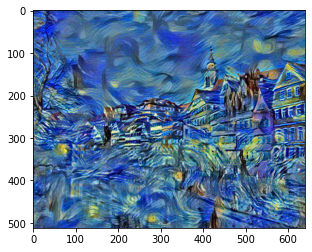

[ Step: 900 / Content loss: 20.99239158630371 / Style loss: 3.9358980655670166]


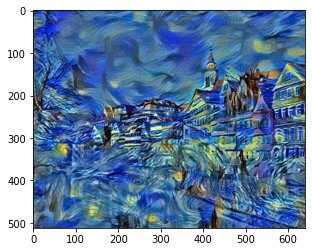

In [62]:
# style transfer 수행
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

In [63]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_1.png')
print('이미지 파일 저장을 완료했습니다.')

이미지 파일 저장을 완료했습니다.


In [64]:
from google.colab import files

# 완성된 이미지를 다운로드합니다.
files.download('output_1.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

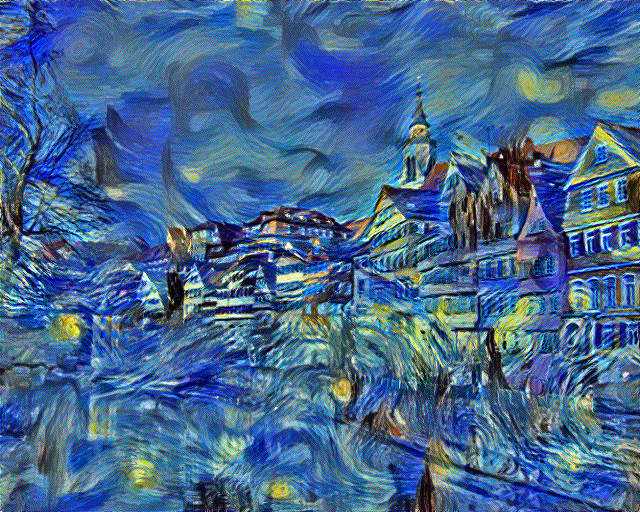

In [65]:
from IPython.display import Image

Image('output_1.png')

In [68]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./Deep-Learning-Paper-Review-and-Practice/code_practices/images/content_img_2.jpg', (512, 512))
style_img = image_loader('./Deep-Learning-Paper-Review-and-Practice/code_practices/images/style_img_2.jpg', (512, 512))

AttributeError: ignored